In [1]:
import dynesty 
import numpy as np
import scipy
import corner
from functools import partial
import jax 

from jax import jit, grad
import jax.numpy as jnp
import jax.scipy.stats as stats

In [2]:
class priorTransform():
    def __init__(self):
        pass
        
    #@partial(jit, static_argnums=(0,))
    def __call__(self, u: np.ndarray) -> np.ndarray:
        return 5. * (2. * u - 1.)

ptform = priorTransform()

In [41]:
class likelihood():
    def __init__(self, ndim):
        C = np.identity(ndim)  # set covariance to identity matrix
        C[C==0] = 0.4  # set off-diagonal terms (strongly correlated)
        self.Cinv = np.linalg.inv(C)  # precision matrix
        self.lnorm = -0.5 * (np.log(2 * np.pi) * ndim + \
                             np.log(np.linalg.det(C)))  # ln(normalization)

    #@partial(jit, static_argnums=(0,))
    def __call__(self, p: np.ndarray):
        return -0.5 * np.dot(p, np.dot(self.Cinv, p)) + self.lnorm

ndim = 25
loglike = likelihood(ndim=ndim)

In [42]:
from dynesty import NestedSampler

# initialize our nested sampler
sampler = NestedSampler(loglike, ptform, ndim, nlive=500)

In [43]:
%%time 
sampler.run_nested()

iter: 17616 | +500 | bound: 91 | nc: 1 | ncall: 2346872 | eff(%):  0.772 | loglstar:   -inf < -22.740 <    inf | logz: -57.454 +/-  0.270 | dlogz:  0.001 >  0.509                                    

CPU times: user 1min 43s, sys: 1min 1s, total: 2min 45s
Wall time: 56.8 s


In [44]:
results = sampler.results
new_samples = results.samples_equal()

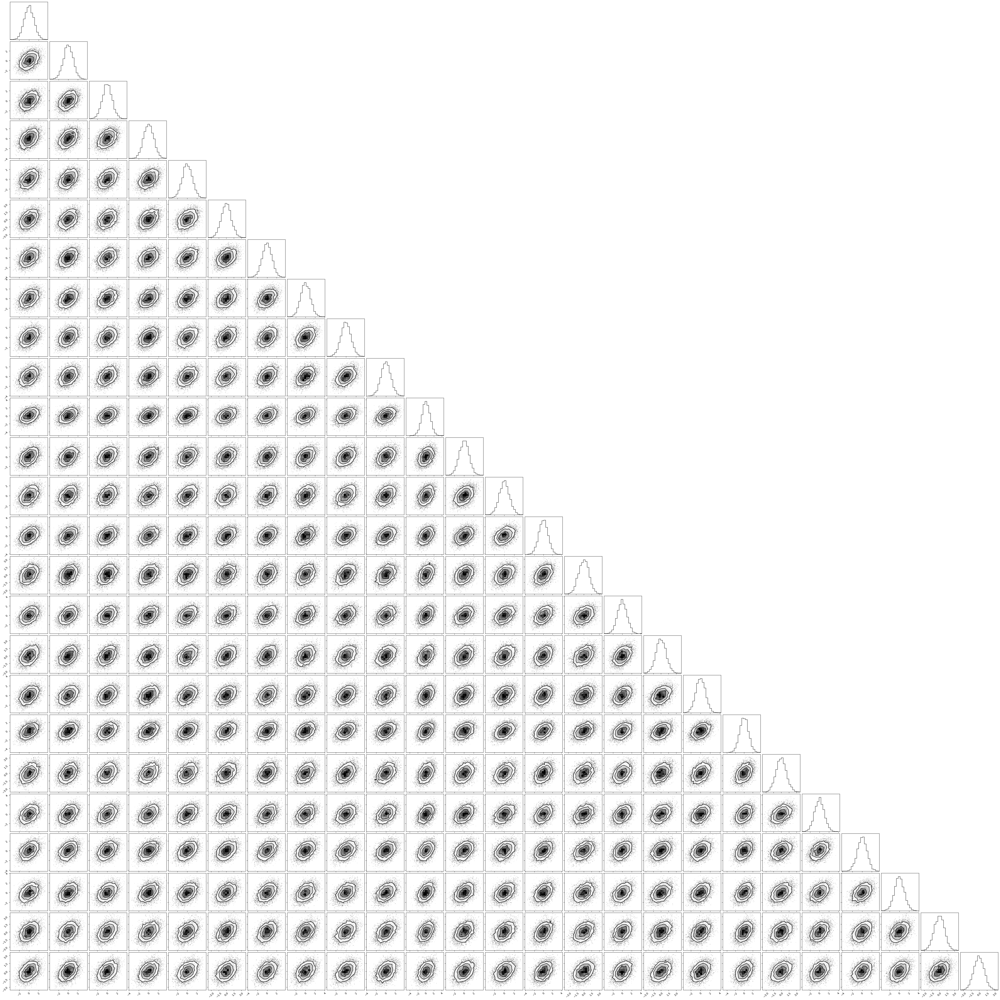

In [45]:
corner.corner(new_samples);

In [50]:
class jikelihood():
    def __init__(self, ndim):
        C = np.identity(ndim)  # set covariance to identity matrix
        C[C==0] = 0.4  # set off-diagonal terms (strongly correlated)
        self.Cinv = np.linalg.inv(C)  # precision matrix
        self.lnorm = -0.5 * (np.log(2 * np.pi) * ndim + np.log(np.linalg.det(C)))  # ln(normalization)

    @partial(jit, static_argnums=(0,))
    def __call__(self, p: np.ndarray):
        return -0.5 * jnp.dot(p, jnp.dot(self.Cinv, p)) + self.lnorm

ndim = 25
logjike = jikelihood(ndim=ndim)
print(logjike(np.random.randn(ndim)))

-40.11884


In [51]:
jampler = NestedSampler(logjike, ptform, ndim, nlive=500)

In [52]:
%%time 
jampler.run_nested()

iter: 17899 | +500 | bound: 90 | nc: 1 | ncall: 2392840 | eff(%):  0.769 | loglstar:   -inf < -21.589 <    inf | logz: -56.894 +/-  0.260 | dlogz:  0.001 >  0.509                                    

CPU times: user 2min 1s, sys: 44.7 s, total: 2min 46s
Wall time: 1min 2s


In [53]:
jesults = jampler.results
new_jamples = jesults.samples_equal()

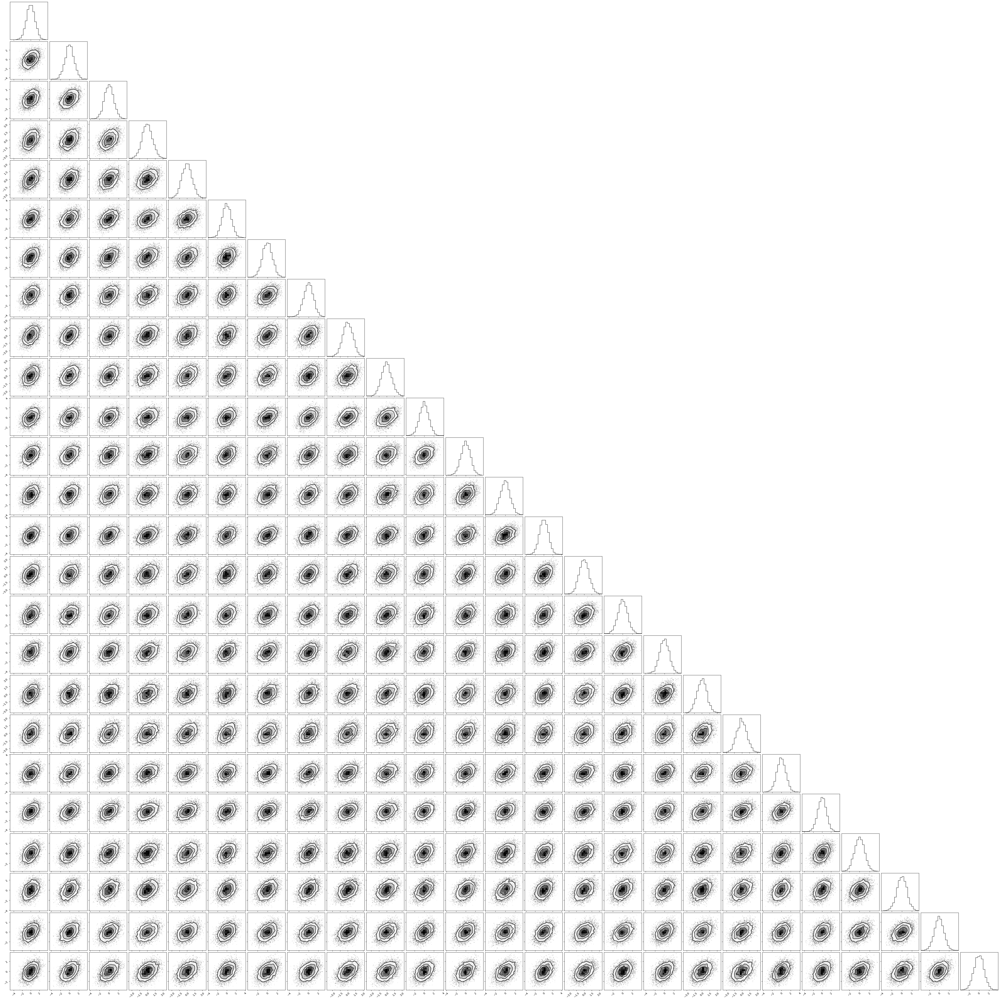

In [54]:
corner.corner(new_jamples);